In [1]:
import pandas as pd
import polars as pl
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from sklearn.decomposition import PCA, FastICA

import torch
from torch.utils.data import DataLoader, Dataset

from mne.preprocessing import ICA

from scipy import signal
from scipy.ndimage import median_filter


from src.styles import *
set_styles()


from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
def target_status(row):
    num_annot = row.iloc[-6:].sum()
    if (num_annot < 3):
        return 'weak'
    
    row = row.iloc[-6:] / num_annot
    delta = 2. / num_annot
    if (row.iloc[-6:] == 1).any():
        return 'ideal'
    elif (row['other_vote'] >= (0.5 - delta)) & (row['other_vote'] <= (0.5 + delta)) & (row.iloc[-6:-1] == (1. - row['other_vote'])).any():
        return 'proto'
    elif (row['other_vote'] < delta):
        for i in range(2, 7):
            cur = row.iloc[-i]
            if (cur >= (0.5 - delta)) & (cur <= (0.5 + delta)):
                if ((row.iloc[-6:-i] == (1. - cur)).any()) | ((row.iloc[-i+1:-1] == (1. - cur)).any()):
                    return 'edge'
                
    return 'weak'

In [3]:
path = 'data/train.csv'
df = pd.read_csv(path).sort_values(['eeg_id', 'eeg_label_offset_seconds'])
dif = df['eeg_label_offset_seconds'] - df['eeg_label_offset_seconds'].shift(1)
df = df.loc[~((dif > 0) & (dif < 50))].reset_index(drop=True) # use only different events

num_annotators = df.iloc[:, -6:].sum(axis=1)
status = df.apply(lambda row: target_status(row), axis=1)

df.insert(df.shape[1] - 7, 'num_annotators', num_annotators)
df.insert(df.shape[1] - 7, 'status', status)
df

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,num_annotators,status,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,568657,0,0.0,789577333,0,0.0,1825637311,20654,12,weak,Other,0,0,3,0,2,7
1,582999,0,0.0,1552638400,0,0.0,1722186807,20230,14,weak,LPD,0,12,0,1,0,1
2,642382,0,0.0,14960202,12,1008.0,3254468733,5955,1,weak,Other,0,0,0,0,0,1
3,751790,0,0.0,618728447,4,908.0,2898467035,38549,1,weak,GPD,0,0,1,0,0,0
4,778705,0,0.0,52296320,0,0.0,3255875127,40955,2,weak,Other,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,4293354003,0,0.0,1188113564,0,0.0,447244163,16610,2,weak,GRDA,0,0,0,0,1,1
17085,4293843368,0,0.0,1549502620,0,0.0,1618953053,15065,2,weak,GRDA,0,0,0,0,1,1
17086,4294455489,0,0.0,2105480289,0,0.0,469526364,56,1,weak,Other,0,0,0,0,0,1
17087,4294858825,0,0.0,657299228,0,0.0,561576493,4312,15,weak,Other,0,0,0,0,1,14


In [4]:
def get_diagnosis(dict):
    res = ''
    for k,v in dict.items():
        if v > 0:
            res += '| ' + k[:-5] + ' ' + str(v) + ' |'
    return res

In [5]:
N_EXAMPLES = 5

df_ideal = df.loc[df['status'] == 'ideal'] \
    .sort_values(['expert_consensus', 'num_annotators'], ascending=False) \
    .groupby('expert_consensus') \
    .head(N_EXAMPLES)
df_ideal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,num_annotators,status,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
8399,2088807520,0,0.0,198643605,0,0.0,2493314214,40881,16,ideal,Seizure,16,0,0,0,0,0
12152,3030710864,0,0.0,388803499,0,0.0,2569163393,14965,16,ideal,Seizure,16,0,0,0,0,0
932,241433122,0,0.0,2058601455,0,0.0,663904781,4863,15,ideal,Seizure,15,0,0,0,0,0
3191,794842413,0,0.0,1946784308,0,0.0,3303915154,24619,15,ideal,Seizure,15,0,0,0,0,0
6196,1540758697,0,0.0,1522387879,0,0.0,3511912371,50295,15,ideal,Seizure,15,0,0,0,0,0
2622,658623458,0,0.0,746484395,0,0.0,1066857183,63946,23,ideal,Other,0,0,0,0,0,23
2366,590374806,0,0.0,766843679,0,0.0,2332265795,36490,22,ideal,Other,0,0,0,0,0,22
3266,811958440,0,0.0,1863972381,0,0.0,2545608526,9223,21,ideal,Other,0,0,0,0,0,21
3738,936283997,0,0.0,1119143423,0,0.0,1615809118,1568,21,ideal,Other,0,0,0,0,0,21
3847,963358456,0,0.0,849899253,0,0.0,3833503013,26342,21,ideal,Other,0,0,0,0,0,21


2088807520


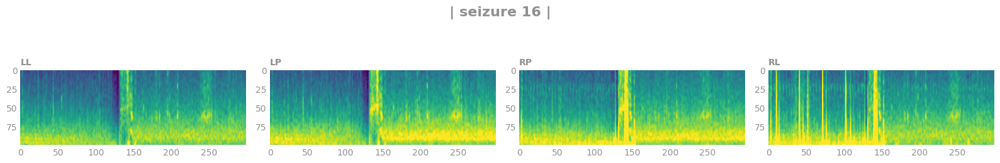

3030710864


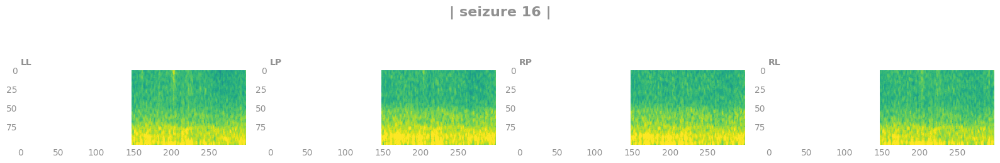

241433122


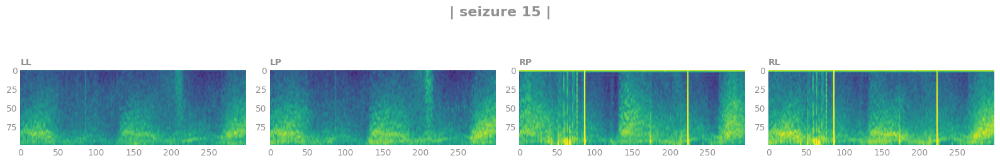

794842413


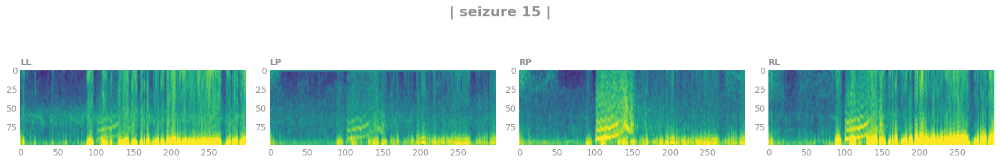

1540758697


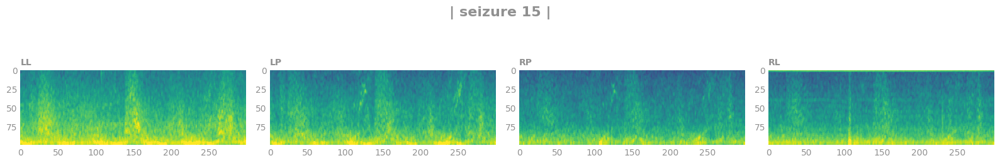

658623458


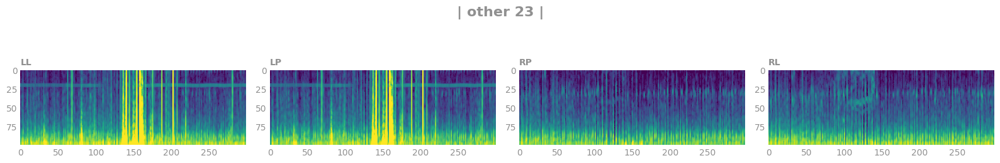

590374806


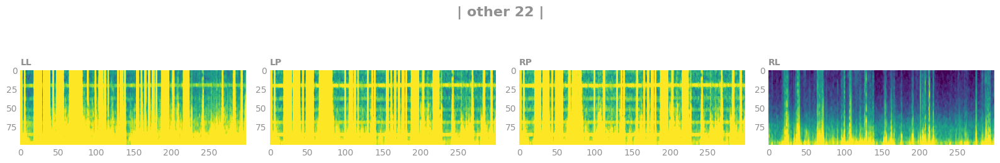

811958440


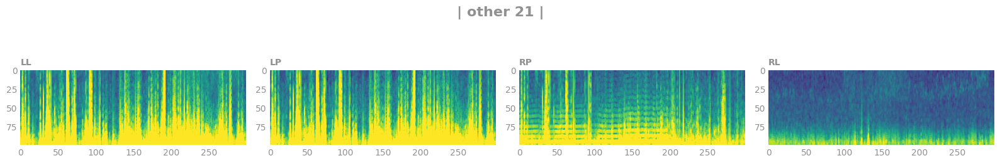

936283997


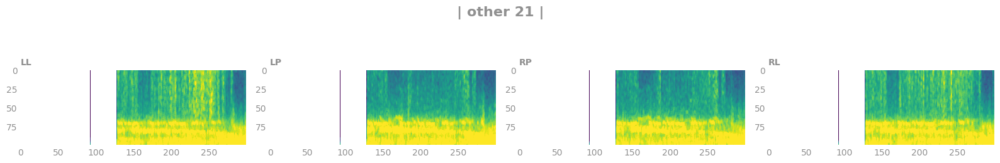

963358456


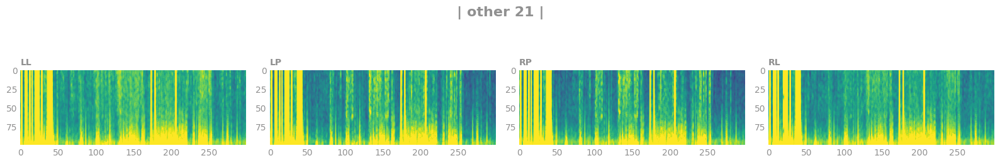

2713014975


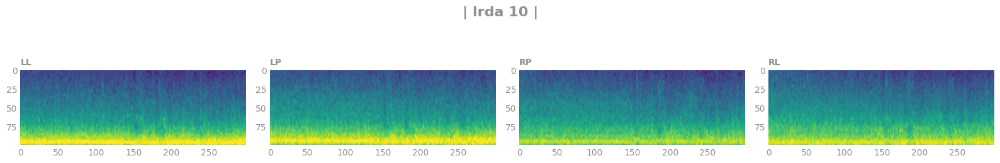

839459106


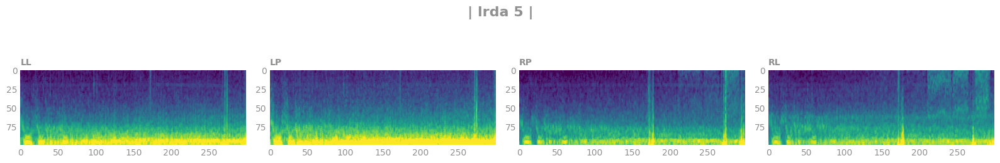

7585449


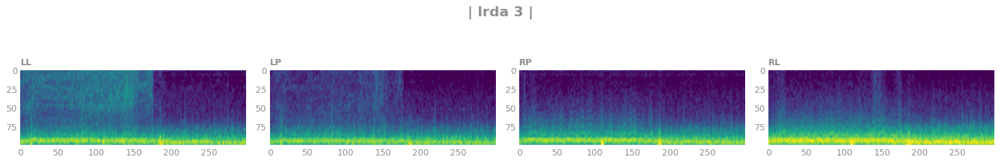

50469106


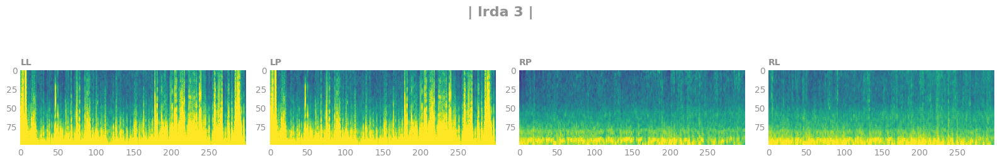

58444132


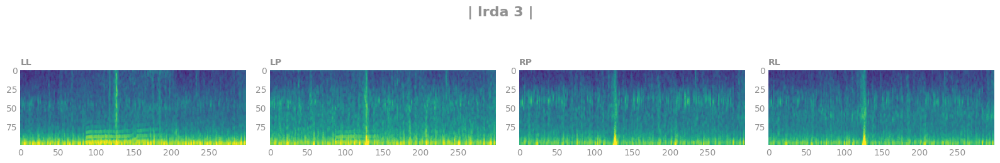

1317431280


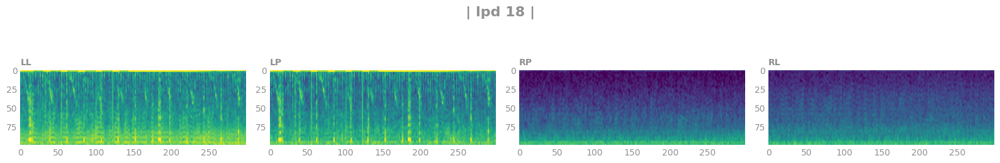

1898956741


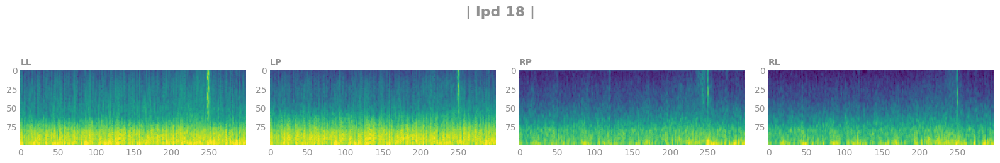

4221431176


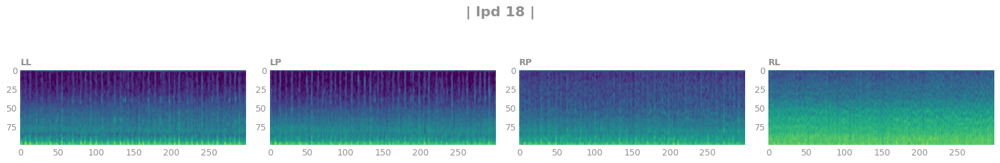

35755743


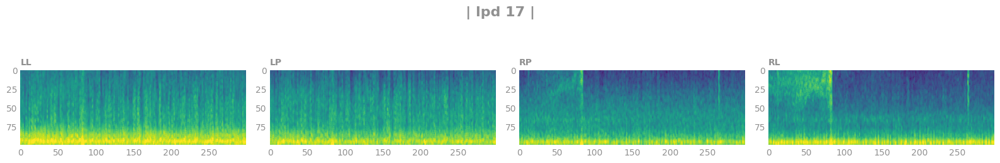

586497589


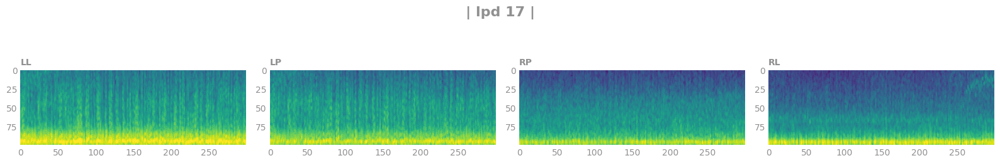

167136080


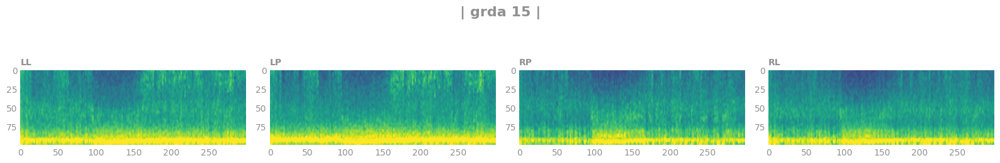

944845698


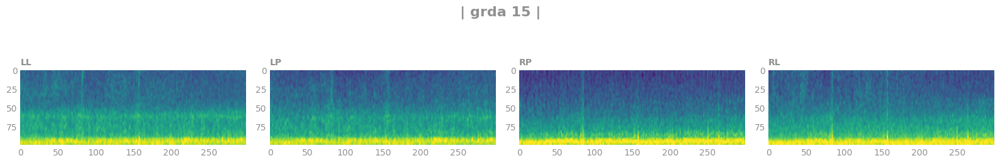

963265939


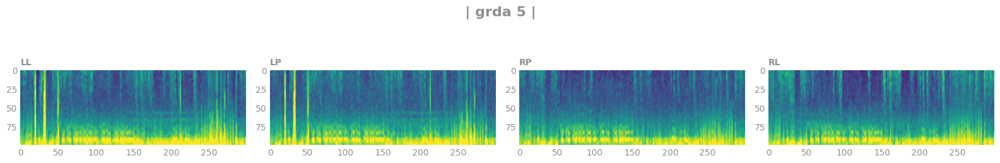

5168624


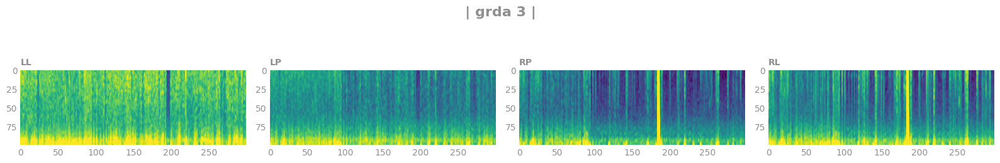

6259482


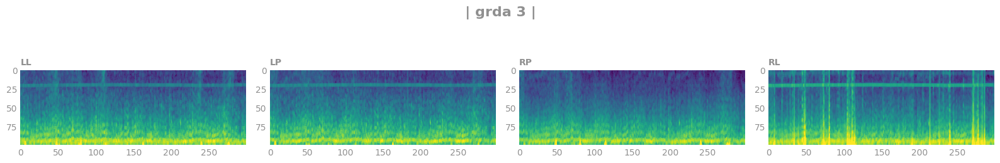

1058173302


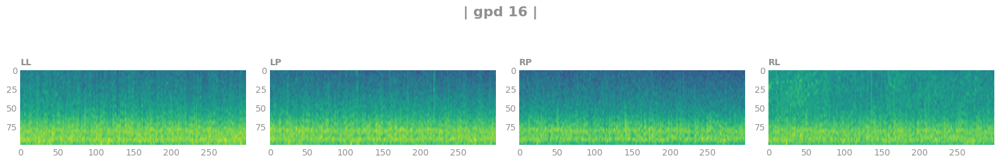

1300795281


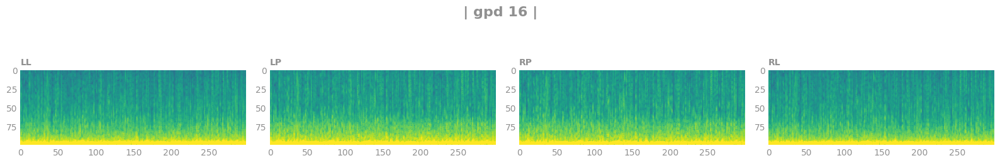

1463717064


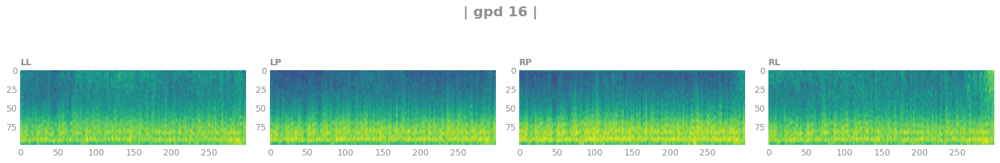

1606805366


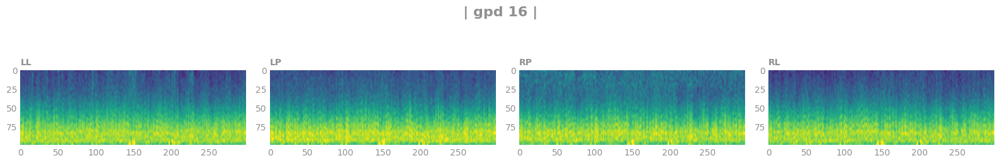

3139700594


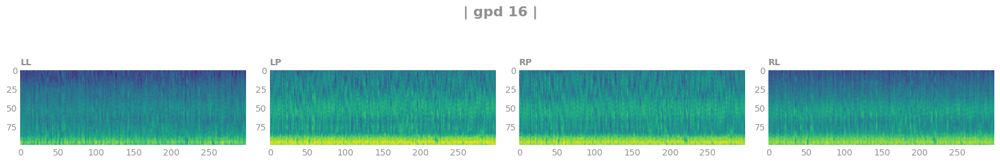

In [6]:
def filter_eeg(eeg):
    b, a = signal.butter(N=4, Wn=[0.5, 10], btype='band', fs=SR)
    filtered_data = signal.filtfilt(b, a, eeg.values, axis=0)
    return pd.DataFrame(filtered_data, columns=eeg.columns)

path_eeg = 'data/train_eegs/'
path_spectrogram = 'data/train_spectrograms/'
SPECTROGRAMS = ['LL','LP','RP','RL']
SP_LEN = 300
SP_NUM_FREQ = 100
SPECTROGRAM_COLS = [
['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19', 'LL_17.38', 'LL_17.58', 'LL_17.77', 'LL_17.97', 'LL_18.16', 'LL_18.36', 'LL_18.55', 'LL_18.75', 'LL_18.95', 'LL_19.14', 'LL_19.34', 'LL_19.53', 'LL_19.73', 'LL_19.92'],
['LP_0.59', 'LP_0.78', 'LP_0.98', 'LP_1.17', 'LP_1.37', 'LP_1.56', 'LP_1.76', 'LP_1.95', 'LP_2.15', 'LP_2.34', 'LP_2.54', 'LP_2.73', 'LP_2.93', 'LP_3.13', 'LP_3.32', 'LP_3.52', 'LP_3.71', 'LP_3.91', 'LP_4.1', 'LP_4.3', 'LP_4.49', 'LP_4.69', 'LP_4.88', 'LP_5.08', 'LP_5.27', 'LP_5.47', 'LP_5.66', 'LP_5.86', 'LP_6.05', 'LP_6.25', 'LP_6.45', 'LP_6.64', 'LP_6.84', 'LP_7.03', 'LP_7.23', 'LP_7.42', 'LP_7.62', 'LP_7.81', 'LP_8.01', 'LP_8.2', 'LP_8.4', 'LP_8.59', 'LP_8.79', 'LP_8.98', 'LP_9.18', 'LP_9.38', 'LP_9.57', 'LP_9.77', 'LP_9.96', 'LP_10.16', 'LP_10.35', 'LP_10.55', 'LP_10.74', 'LP_10.94', 'LP_11.13', 'LP_11.33', 'LP_11.52', 'LP_11.72', 'LP_11.91', 'LP_12.11', 'LP_12.3', 'LP_12.5', 'LP_12.7', 'LP_12.89', 'LP_13.09', 'LP_13.28', 'LP_13.48', 'LP_13.67', 'LP_13.87', 'LP_14.06', 'LP_14.26', 'LP_14.45', 'LP_14.65', 'LP_14.84', 'LP_15.04', 'LP_15.23', 'LP_15.43', 'LP_15.63', 'LP_15.82', 'LP_16.02', 'LP_16.21', 'LP_16.41', 'LP_16.6', 'LP_16.8', 'LP_16.99', 'LP_17.19', 'LP_17.38', 'LP_17.58', 'LP_17.77', 'LP_17.97', 'LP_18.16', 'LP_18.36', 'LP_18.55', 'LP_18.75', 'LP_18.95', 'LP_19.14', 'LP_19.34', 'LP_19.53', 'LP_19.73', 'LP_19.92'],
['RP_0.59', 'RP_0.78', 'RP_0.98', 'RP_1.17', 'RP_1.37', 'RP_1.56', 'RP_1.76', 'RP_1.95', 'RP_2.15', 'RP_2.34', 'RP_2.54', 'RP_2.73', 'RP_2.93', 'RP_3.13', 'RP_3.32', 'RP_3.52', 'RP_3.71', 'RP_3.91', 'RP_4.1', 'RP_4.3', 'RP_4.49', 'RP_4.69', 'RP_4.88', 'RP_5.08', 'RP_5.27', 'RP_5.47', 'RP_5.66', 'RP_5.86', 'RP_6.05', 'RP_6.25', 'RP_6.45', 'RP_6.64', 'RP_6.84', 'RP_7.03', 'RP_7.23', 'RP_7.42', 'RP_7.62', 'RP_7.81', 'RP_8.01', 'RP_8.2', 'RP_8.4', 'RP_8.59', 'RP_8.79', 'RP_8.98', 'RP_9.18', 'RP_9.38', 'RP_9.57', 'RP_9.77', 'RP_9.96', 'RP_10.16', 'RP_10.35', 'RP_10.55', 'RP_10.74', 'RP_10.94', 'RP_11.13', 'RP_11.33', 'RP_11.52', 'RP_11.72', 'RP_11.91', 'RP_12.11', 'RP_12.3', 'RP_12.5', 'RP_12.7', 'RP_12.89', 'RP_13.09', 'RP_13.28', 'RP_13.48', 'RP_13.67', 'RP_13.87', 'RP_14.06', 'RP_14.26', 'RP_14.45', 'RP_14.65', 'RP_14.84', 'RP_15.04', 'RP_15.23', 'RP_15.43', 'RP_15.63', 'RP_15.82', 'RP_16.02', 'RP_16.21', 'RP_16.41', 'RP_16.6', 'RP_16.8', 'RP_16.99', 'RP_17.19', 'RP_17.38', 'RP_17.58', 'RP_17.77', 'RP_17.97', 'RP_18.16', 'RP_18.36', 'RP_18.55', 'RP_18.75', 'RP_18.95', 'RP_19.14', 'RP_19.34', 'RP_19.53', 'RP_19.73', 'RP_19.92'],
['RL_0.59', 'RL_0.78', 'RL_0.98', 'RL_1.17', 'RL_1.37', 'RL_1.56', 'RL_1.76', 'RL_1.95', 'RL_2.15', 'RL_2.34', 'RL_2.54', 'RL_2.73', 'RL_2.93', 'RL_3.13', 'RL_3.32', 'RL_3.52', 'RL_3.71', 'RL_3.91', 'RL_4.1', 'RL_4.3', 'RL_4.49', 'RL_4.69', 'RL_4.88', 'RL_5.08', 'RL_5.27', 'RL_5.47', 'RL_5.66', 'RL_5.86', 'RL_6.05', 'RL_6.25', 'RL_6.45', 'RL_6.64', 'RL_6.84', 'RL_7.03', 'RL_7.23', 'RL_7.42', 'RL_7.62', 'RL_7.81', 'RL_8.01', 'RL_8.2', 'RL_8.4', 'RL_8.59', 'RL_8.79', 'RL_8.98', 'RL_9.18', 'RL_9.38', 'RL_9.57', 'RL_9.77', 'RL_9.96', 'RL_10.16', 'RL_10.35', 'RL_10.55', 'RL_10.74', 'RL_10.94', 'RL_11.13', 'RL_11.33', 'RL_11.52', 'RL_11.72', 'RL_11.91', 'RL_12.11', 'RL_12.3', 'RL_12.5', 'RL_12.7', 'RL_12.89', 'RL_13.09', 'RL_13.28', 'RL_13.48', 'RL_13.67', 'RL_13.87', 'RL_14.06', 'RL_14.26', 'RL_14.45', 'RL_14.65', 'RL_14.84', 'RL_15.04', 'RL_15.23', 'RL_15.43', 'RL_15.63', 'RL_15.82', 'RL_16.02', 'RL_16.21', 'RL_16.41', 'RL_16.6', 'RL_16.8', 'RL_16.99', 'RL_17.19', 'RL_17.38', 'RL_17.58', 'RL_17.77', 'RL_17.97', 'RL_18.16', 'RL_18.36', 'RL_18.55', 'RL_18.75', 'RL_18.95', 'RL_19.14', 'RL_19.34', 'RL_19.53', 'RL_19.73', 'RL_19.92'],
]
eps = 1e-10

for index, row in df_ideal.iterrows():
    print(row['eeg_id'])
    
    label = get_diagnosis(row.iloc[-6:].to_dict())

    spectrograms_offset = int(row['spectrogram_label_offset_seconds'] * 0.5)

    _, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 3))
    axes = axes.ravel()
    raw_data = pl.read_parquet(path_spectrogram + f'{row["spectrogram_id"]}.parquet')
    for i, prefix in enumerate(SPECTROGRAMS):
        df_sp = raw_data.slice(spectrograms_offset, SP_LEN).select(SPECTROGRAM_COLS[i])
        sp = np.flip(np.log10(df_sp.to_numpy().T + eps))
        axes[i].imshow(sp, vmin=-2, vmax=2)
        axes[i].set_title(prefix, fontsize=10)
    plt.suptitle(label, fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()